### Introduction 

Dans cette analyse, nous allons explorer les fichiers 'ticket_data.csv' , 'providers.csv' , 'cities.csv' et 'stations.csv' .  
Notre objectif principal est d'extraire des informations intéressantes de ce jeu de données, telles que les prix et durées minimum , moyens et maximum par trajet, ainsi que d'analyser les différences de prix et de durée en fonction du mode de transport (train, bus, covoiturage) et la distance du trajet 
Nous utiliserons Python et la bibliothèque Pandas pour l'analyse des donées

### Importation des biblio nécessaires

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from geopy.distance import geodesic


### Read the Data

Tout d'abord, nous devons charger les fichiers de données dans notre environnement Python 

In [2]:
ticket_data = pd.read_csv('ticket_data.csv')
cities = pd.read_csv('cities.csv')
stations = pd.read_csv('stations.csv')
providers = pd.read_csv('providers.csv')

### Exploration des données

Avant de commencer l''analyse, il est important de comprendre la structure et le contenu de nos données. 
Nous allons utiliser quelques méthodes de Pandas pour explorer les données. 

Nous pouvons utiliser la méthode 'head()' pour afficher les premières lignes de chaque dataframe:

In [3]:
ticket_data.head()


,id,company,o_station,d_station,departure_ts,arrival_ts,price_in_cents,search_ts,middle_stations,other_companies,o_city,d_city
0,6795025,8385,NaN,NaN,2017-10-13 14:00:00+00,2017-10-13 20:10:00+00,4550,2017-10-01 00:13:31.327+00,NaN,NaN,611,542
1,6795026,9,63.0,1044.0,2017-10-13 13:05:00+00,2017-10-14 06:55:00+00,1450,2017-10-01 00:13:35.773+00,"{149,418}",{13},611,542
2,6795027,8377,5905.0,6495.0,2017-10-13 13:27:00+00,2017-10-14 21:24:00+00,7400,2017-10-01 00:13:40.212+00,"{798,798,6794,6246}","{8377,8376}",611,542
3,6795028,8377,5905.0,6495.0,2017-10-13 13:27:00+00,2017-10-14 11:02:00+00,13500,2017-10-01 00:13:40.213+00,"{798,798,6794,6246}","{8377,8376}",611,542
4,6795029,8381,5905.0,6495.0,2017-10-13 21:46:00+00,2017-10-14 19:32:00+00,7710,2017-10-01 00:13:40.213+00,"{5983,5983}",{8380},611,542


In [4]:
cities.head()

,id,local_name,unique_name,latitude,longitude,population
0,5159,"Padua, Veneto, Italia",padua,45.406435,11.876761,209678.0
1,76,"Barcelona, Cataluña, España",barcelona,41.385064,2.173404,1611822.0
2,81,"Basel, Basel-Stadt, Schweiz",basel,47.593437,7.619812,NaN
3,259,"Erlangen, Bayern, Deutschland",erlangen,49.589674,11.011961,105412.0
4,11979,"Balș, Olt, România",balș,44.353354,24.095672,NaN


In [5]:
stations.head()

,id,unique_name,latitude,longitude
0,1,Aalen (Stuttgarter Straße),48.835296,10.092956
1,2,Aéroport Bordeaux-Mérignac,44.830226,-0.700883
2,3,Aéroport CDG,49.009900,2.559310
3,4,Aéroport de Berlin-Schönefeld,52.389446,13.520345
4,5,Aéroport de Dresden,51.123604,13.764737


In [6]:
providers.head()

,id,company_id,provider_id,name,fullname,has_wifi,has_plug,has_adjustable_seats,has_bicycle,transport_type
0,9,1,NaN,ouibus,Ouibus,True,True,True,False,bus
1,10,2,NaN,deinbus,Deinbus.de,False,False,False,False,bus
2,11,3,NaN,infobus,Infobus,False,False,False,False,bus
3,12,4,NaN,studentAgency,Student Agency,False,False,False,False,bus
4,13,5,NaN,flixbus,Flixbus,True,False,False,False,bus


Cela nous donnera un aperçu des premières lignes de chaque dataframe.

Ensuite, nous pouvons utiliser la méthode 'info()' pour afficher des informations sur les données, telles que les noms des colonnes, le nombre de valeurs non nulles, les types de données,etc..

In [7]:
print("Ticket Data Info:")
print(ticket_data.info())

print("\nCities Info:")
print(cities.info())

print("\nStations Info:")
print(stations.info())

print("\nProviders Info:")
print(providers.info())

Ticket Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74168 entries, 0 to 74167
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               74168 non-null  int64  
 1   company          74168 non-null  int64  
 2   o_station        32727 non-null  float64
 3   d_station        32727 non-null  float64
 4   departure_ts     74168 non-null  object 
 5   arrival_ts       74168 non-null  object 
 6   price_in_cents   74168 non-null  int64  
 7   search_ts        74168 non-null  object 
 8   middle_stations  32727 non-null  object 
 9   other_companies  32727 non-null  object 
 10  o_city           74168 non-null  int64  
 11  d_city           74168 non-null  int64  
dtypes: float64(2), int64(5), object(5)
memory usage: 6.8+ MB
None

Cities Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8040 entries, 0 to 8039
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype  


Enfin nous pouvons utiliser la méthode 'describe()' pour obtenir des statistiques descriptives sur les données numériques de chaque dataframe:

In [8]:
print("Ticket Data Description:")
print(ticket_data.describe())

print("\nCities Description:")
print(cities.describe())

print("\nStations Description:")
print(stations.describe())

print("\nProviders Description:")
print(providers.describe())

Ticket Data Description:
                 id       company     o_station     d_station  price_in_cents  \
count  7.416800e+04  74168.000000  32727.000000  32727.000000    74168.000000   
mean   6.832108e+06   7109.565527   2907.132673   2347.858129     4382.711061   
std    2.141060e+04   3005.380792   3347.629180   3090.798007     3739.325367   
min    6.795025e+06      9.000000      3.000000      3.000000      300.000000   
25%    6.813567e+06   8376.000000    400.000000    396.000000     1900.000000   
50%    6.832108e+06   8385.000000    701.000000    575.000000     3350.000000   
75%    6.850650e+06   8385.000000   6246.000000   4538.000000     5250.000000   
max    6.869192e+06   8387.000000  11017.000000  11017.000000    38550.000000   

             o_city        d_city  
count  74168.000000  74168.000000  
mean     849.186105    883.776265  
std     1485.791782   1654.698575  
min        5.000000      1.000000  
25%      485.000000    453.000000  
50%      628.000000    562.00

Cela nous donnera des informations sur les données numériques, tq les moyennes, les écarts-types, les min et maximums.


### Détection des valeurs manquantes 

In [9]:
ticket_data.isnull().sum().sort_values(ascending=False)

o_station          41441
d_station          41441
middle_stations    41441
other_companies    41441
id                     0
company                0
departure_ts           0
arrival_ts             0
price_in_cents         0
search_ts              0
o_city                 0
d_city                 0
dtype: int64

In [10]:
providers.isnull().sum().sort_values(ascending=False)

provider_id             14
has_wifi                 3
has_plug                 3
has_adjustable_seats     3
has_bicycle              3
id                       0
company_id               0
name                     0
fullname                 0
transport_type           0
dtype: int64

In [11]:
cities.isnull().sum().sort_values(ascending=False)

population     7671
unique_name       1
id                0
local_name        0
latitude          0
longitude         0
dtype: int64

In [12]:
stations.isnull().sum().sort_values(ascending=False)

id             0
unique_name    0
latitude       0
longitude      0
dtype: int64

In [13]:
print("presence des valeurs Nan de ticket_data :",ticket_data.isnull().values.any())
print("presence des valeurs Nan de providers :",providers.isnull().values.any())
print("presence des valeurs Nan de cities :",cities.isnull().values.any())
print("presence des valeurs Nan de stations :",stations.isnull().values.any())

presence des valeurs Nan de ticket_data : True
presence des valeurs Nan de providers : True
presence des valeurs Nan de cities : True
presence des valeurs Nan de stations : False


Pour corriger les valeurs manquantes dans les DataFrames , il faut vérifier q si ces valeurs manquantes ont un impact sur les analyses que nous allons réaliser.
Si ces lignes  ne sont pas essentienlles pour l'analyse , nous pouvons les supprimer. 
Sinon , il est possible de les remplacer par une valeur par défaut ou d'utiliser une méthode de remplissage.

#### remplace les valeurs manquantes du ticket_data par la moyenne de chaque colonne

In [14]:
ticket_data['o_station'].fillna(ticket_data['o_station'].mean(), inplace=True) # remplace les valeurs manquantes par la moyenne de la colonne
ticket_data['d_station'].fillna(ticket_data['d_station'].mean(), inplace=True) # remplace les valeurs manquantes par la moyenne de la colonne


In [15]:
ticket_data.isnull().sum().sort_values(ascending=False)

middle_stations    41441
other_companies    41441
id                     0
company                0
o_station              0
d_station              0
departure_ts           0
arrival_ts             0
price_in_cents         0
search_ts              0
o_city                 0
d_city                 0
dtype: int64

#### remplace les valeurs manquantes du providers par la moyenne de chaque colonne

In [16]:
providers['has_wifi'].fillna(providers['has_wifi'].mean(), inplace=True) # remplace les valeurs manquantes par la moyenne de la colonne
providers['has_plug'].fillna(providers['has_plug'].mean(), inplace=True) # remplace les valeurs manquantes par la moyenne de la colonne
providers['has_adjustable_seats'].fillna(providers['has_adjustable_seats'].mean(), inplace=True) # remplace les valeurs manquantes par la moyenne de la colonne
providers['has_bicycle'].fillna(providers['has_bicycle'].mean(), inplace=True) # remplace les valeurs manquantes par la moyenne de la colonne
providers.isnull().sum().sort_values(ascending=False)

provider_id             14
id                       0
company_id               0
name                     0
fullname                 0
has_wifi                 0
has_plug                 0
has_adjustable_seats     0
has_bicycle              0
transport_type           0
dtype: int64

In [17]:
cities['population'].fillna(cities['population'].mean(), inplace=True)
#cities.drop('unique_name', axis=1, inplace=True)
cities.isnull().sum().sort_values(ascending=False)

unique_name    1
id             0
local_name     0
latitude       0
longitude      0
population     0
dtype: int64

### Prix min, moyen et max

In [18]:
min_price = ticket_data['price_in_cents'].min()
max_price = ticket_data['price_in_cents'].max()
mean_price = ticket_data['price_in_cents'].mean()
print(f"Prix min: {min_price}, Prix max: {max_price}, Prix moyen: {mean_price}")

Prix min: 300, Prix max: 38550, Prix moyen: 4382.711061374178


### Durée min, max, moyenne par trajet

Ce code permet de converrtir les colonnes 'departure_ts'et 'arrival_ts' en format datetime pour pouvoir les manipuler plus facilement. 
Ensuite , on a calculé la durée de chaque trajet en faisant la différence entre l'heure d'arrivée et l'heure de départ , et les durée min,max et myenne sont affichées à l'aide de la fonction print()

In [19]:
# convertir les colonnes en format date 
ticket_data['departure_ts']=pd.to_datetime(ticket_data['departure_ts'])
ticket_data['arrival_ts']=pd.to_datetime(ticket_data['arrival_ts'])
# calcule des durées

ticket_data['duration']=ticket_data['arrival_ts'] - ticket_data['departure_ts']
min_duration = ticket_data['duration'].min()
max_duration = ticket_data['duration'].max()
mean_duration = ticket_data['duration'].mean()

print(f"Durée min: {min_duration}, Durée max: {max_duration}, Durée moyenne: {mean_duration}")

Durée min: 0 days 00:20:00, Durée max: 20 days 12:51:00, Durée moyenne: 0 days 07:04:37.247600043


## Différence de prix moyen et durée selon le train, le bus et le covoit selon la distance du trajet

Pour calculer la différence de prix moyen et la durée selon le type de transport en fonction de la distance du trajet il faut : 
1- Calculez la distance entre les villes d'origine et de distination en utilisant les coordonnées (latitude et longitude)des villes. 
2- Catégoriez les distances en intervalles (0-200km , 201-800km , etc)
3- Filtrez les données du ticket_data en fonction des types de transport , puis faites la moyenne des prix et la durée pour chaque type de transport et de chaque catégorie.

In [20]:
# Fusionner les donées 
ticket_data = ticket_data.merge(cities[['id','latitude','longitude']],left_on='o_city',right_on='id',suffixes =('', '_o'))
ticket_data = ticket_data.merge(cities[['id','latitude','longitude']],left_on='d_city',right_on='id',suffixes =('', '_d'))
ticket_data = ticket_data.merge(providers[['id','transport_type']],left_on='company',right_on='id',suffixes =('', 'company'))
ticket_data


,id,company,o_station,d_station,departure_ts,arrival_ts,price_in_cents,search_ts,middle_stations,other_companies,...,d_city,duration,id_o,latitude,longitude,id_d,latitude_d,longitude_d,idcompany,transport_type
0,6795025,8385,2907.132673,2347.858129,2017-10-13 14:00:00+00:00,2017-10-13 20:10:00+00:00,4550,2017-10-01 00:13:31.327+00,NaN,NaN,...,542,0 days 06:10:00,611,47.907018,1.906270,542,43.604452,3.918318,8385,carpooling
1,6797839,8385,2907.132673,2347.858129,2017-10-06 07:00:00+00:00,2017-10-06 15:00:00+00:00,5800,2017-10-02 09:14:41.897+00,NaN,NaN,...,542,0 days 08:00:00,628,48.847702,2.352311,542,43.604452,3.918318,8385,carpooling
2,6797840,8385,2907.132673,2347.858129,2017-10-06 08:20:00+00:00,2017-10-06 16:20:00+00:00,5450,2017-10-02 09:14:41.898+00,NaN,NaN,...,542,0 days 08:00:00,628,48.847702,2.352311,542,43.604452,3.918318,8385,carpooling
3,6797841,8385,2907.132673,2347.858129,2017-10-06 09:50:00+00:00,2017-10-06 17:30:00+00:00,5700,2017-10-02 09:14:41.898+00,NaN,NaN,...,542,0 days 07:40:00,628,48.847702,2.352311,542,43.604452,3.918318,8385,carpooling
4,6797842,8385,2907.132673,2347.858129,2017-10-06 10:00:00+00:00,2017-10-06 18:50:00+00:00,4750,2017-10-02 09:14:41.898+00,NaN,NaN,...,542,0 days 08:50:00,628,48.847702,2.352311,542,43.604452,3.918318,8385,carpooling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74163,6844504,8387,11011.000000,11010.000000,2017-10-14 15:30:00+00:00,2017-10-15 18:45:00+00:00,9600,2017-10-13 17:20:27.878+00,"{11017,11017}",{8387},...,524,1 days 03:15:00,628,48.847702,2.352311,524,49.110633,6.183319,8387,bus
74164,6844505,8387,11012.000000,11010.000000,2017-10-14 16:00:00+00:00,2017-10-15 18:45:00+00:00,9600,2017-10-13 17:20:27.878+00,"{11017,11017}",{8387},...,524,1 days 02:45:00,628,48.847702,2.352311,524,49.110633,6.183319,8387,bus
74165,6832380,8387,11007.000000,11013.000000,2017-10-14 15:20:00+00:00,2017-10-14 21:10:00+00:00,8500,2017-10-10 15:50:48.574+00,"{11017,11017}",{8387},...,694,0 days 05:50:00,272,49.188141,6.899090,694,49.214754,3.994568,8387,bus
74166,6795677,8387,11017.000000,10349.000000,2017-10-18 16:45:00+00:00,2017-10-19 14:40:00+00:00,5300,2017-10-01 09:42:47.386+00,"{11011,279}",{13},...,857,0 days 21:55:00,12166,48.804600,4.259500,857,48.328044,4.100755,8387,bus


In [21]:
# Calculer la distance
ticket_data['distance'] = ticket_data.apply(lambda row: geodesic((row['latitude'], row['longitude']), (row['latitude_d'], row['longitude_d'])).km, axis=1)


In [22]:
# Catégoriser les distances
bins = [0, 200, 800, 2000, np.inf]
labels = ['0-200km', '201-800km', '800-2000km', '2000+km']
ticket_data['distance_category'] = pd.cut(ticket_data['distance'], bins=bins, labels=labels)

# Calculer la durée
ticket_data['departure_ts'] = pd.to_datetime(ticket_data['departure_ts'])
ticket_data['arrival_ts'] = pd.to_datetime(ticket_data['arrival_ts'])
ticket_data['duration'] = (ticket_data['arrival_ts'] - ticket_data['departure_ts']).dt.total_seconds() / 3600

# Calculer les moyennes par type de transport et catégorie de distance
result = ticket_data.groupby(['transport_type', 'distance_category']).agg({'price_in_cents': 'mean', 'duration': 'mean'}).reset_index()
result['price_in_cents'] = result['price_in_cents'] / 100
result.rename(columns={'price_in_cents': 'average_price', 'duration': 'average_duration'}, inplace=True)

print(result)



   transport_type distance_category  average_price  average_duration
0             bus           0-200km      21.828309         10.232515
1             bus         201-800km      34.948500         15.074797
2             bus        800-2000km      69.499500         27.536119
3             bus           2000+km            NaN               NaN
4      carpooling           0-200km      11.773524          1.952040
5      carpooling         201-800km      32.180643          4.763131
6      carpooling        800-2000km      86.265455         13.100233
7      carpooling           2000+km            NaN               NaN
8           train           0-200km      34.879008          4.419400
9           train         201-800km      91.247795          7.677651
10          train        800-2000km     154.637461         12.158617
11          train           2000+km            NaN               NaN


### Un diagramme à barres pour les prix moyens 

<function matplotlib.pyplot.show(close=None, block=None)>

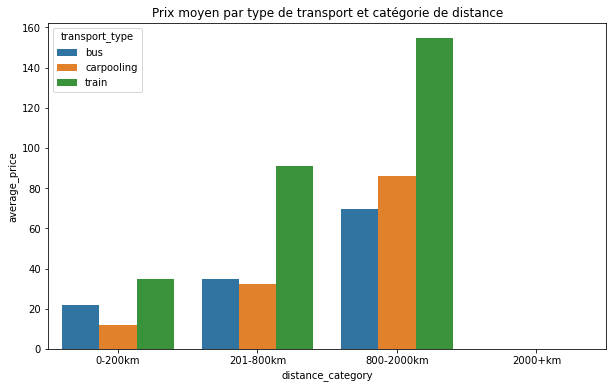

In [23]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10,6))
sns.barplot(x='distance_category',y='average_price', hue='transport_type',data=result)
plt.title ("Prix moyen par type de transport et catégorie de distance")
plt.show

### Un diagramme à barres pour les durées moyennes

<function matplotlib.pyplot.show(close=None, block=None)>

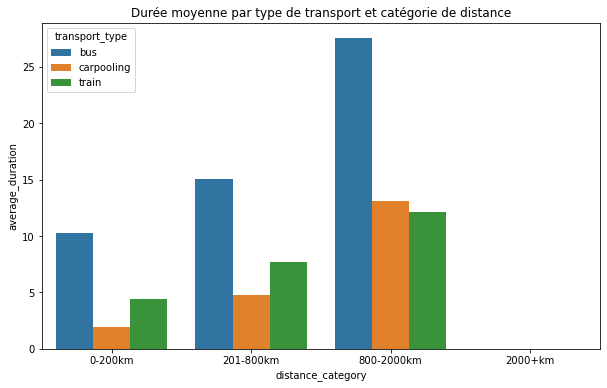

In [24]:
plt.figure(figsize=(10,6))
sns.barplot(x='distance_category',y='average_duration', hue='transport_type',data=result)
plt.title ("Durée moyenne par type de transport et catégorie de distance")
plt.show

### Distrubtion des prix pour chaque compagnie et transport 

<AxesSubplot:xlabel='company', ylabel='price_in_cents'>

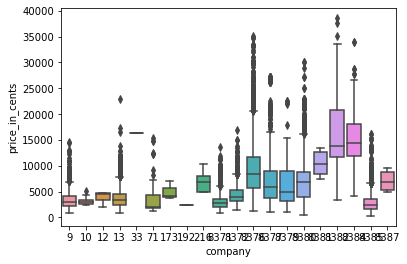

In [25]:
sns.boxplot(x='company',y='price_in_cents',data=ticket_data)

### Prédiction de prix basée sur les données historique

In [70]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

x= ticket_data[['distance','duration']]
y = ticket_data['price_in_cents']

# crée le modéle re regression linéaire
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)
model = LinearRegression().fit(x_train,y_train)
#Faire des prédiction et évaluer le modele

y_pred = model.predict(x_test)

mse = mean_squared_error(y_test,y_pred,squared=False)
print(f"Mean Squared error : {mse:.2f}")


Mean Squared error : 3147.19


### Une carte interactive des gares 

In [27]:
#pip install plotly
import plotly.express as px
station_map = px.scatter_geo(stations,lat='latitude',lon='longitude',hover_name='unique_name',title='Stations Map')
station_map.show()

### Le prix moyen d'un billet par ville 

In [28]:
ticket_data = pd.merge(ticket_data,cities,left_on=['o_city'],right_on=['id'],suffixes=('_o_city','_d_city'))
ticket_data = pd.merge(ticket_data,cities,left_on=['d_city'],right_on=['id'],suffixes=('_o_city','_d_city'))
ticket_data



,id_o_city,company,o_station,d_station,departure_ts,arrival_ts,price_in_cents,search_ts,middle_stations,other_companies,...,unique_name_o_city,latitude_d_city,longitude_d_city,population_o_city,id,local_name_d_city,unique_name_d_city,latitude,longitude,population_d_city
0,6795025,8385,2907.132673,2347.858129,2017-10-13 14:00:00+00:00,2017-10-13 20:10:00+00:00,4550,2017-10-01 00:13:31.327+00,NaN,NaN,...,orleans,47.907018,1.906270,114977.000000,542,"Montpellier, Occitanie, France",montpellier,43.604452,3.918318,275318.000000
1,6795026,9,63.000000,1044.000000,2017-10-13 13:05:00+00:00,2017-10-14 06:55:00+00:00,1450,2017-10-01 00:13:35.773+00,"{149,418}",{13},...,orleans,47.907018,1.906270,114977.000000,542,"Montpellier, Occitanie, France",montpellier,43.604452,3.918318,275318.000000
2,6795027,8377,5905.000000,6495.000000,2017-10-13 13:27:00+00:00,2017-10-14 21:24:00+00:00,7400,2017-10-01 00:13:40.212+00,"{798,798,6794,6246}","{8377,8376}",...,orleans,47.907018,1.906270,114977.000000,542,"Montpellier, Occitanie, France",montpellier,43.604452,3.918318,275318.000000
3,6795028,8377,5905.000000,6495.000000,2017-10-13 13:27:00+00:00,2017-10-14 11:02:00+00:00,13500,2017-10-01 00:13:40.213+00,"{798,798,6794,6246}","{8377,8376}",...,orleans,47.907018,1.906270,114977.000000,542,"Montpellier, Occitanie, France",montpellier,43.604452,3.918318,275318.000000
4,6795029,8381,5905.000000,6495.000000,2017-10-13 21:46:00+00:00,2017-10-14 19:32:00+00:00,7710,2017-10-01 00:13:40.213+00,"{5983,5983}",{8380},...,orleans,47.907018,1.906270,114977.000000,542,"Montpellier, Occitanie, France",montpellier,43.604452,3.918318,275318.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74163,6827907,8380,8012.000000,5772.000000,2017-10-13 15:55:00+00:00,2017-10-13 19:36:00+00:00,2980,2017-10-09 15:02:40.26+00,"{470,470}",{8377},...,ussel,45.512429,2.257469,336018.387534,7179,"La Souterraine, Nouvelle-Aquitaine, France",la-souterraine,46.239780,1.491980,336018.387534
74164,6827908,8380,8012.000000,5772.000000,2017-10-13 15:55:00+00:00,2017-10-13 19:04:00+00:00,3140,2017-10-09 15:02:40.26+00,"{470,470}",{8380},...,ussel,45.512429,2.257469,336018.387534,7179,"La Souterraine, Nouvelle-Aquitaine, France",la-souterraine,46.239780,1.491980,336018.387534
74165,6827909,8380,8012.000000,5772.000000,2017-10-13 17:54:00+00:00,2017-10-14 07:38:00+00:00,2980,2017-10-09 15:02:40.26+00,"{470,470}",{8377},...,ussel,45.512429,2.257469,336018.387534,7179,"La Souterraine, Nouvelle-Aquitaine, France",la-souterraine,46.239780,1.491980,336018.387534
74166,6841417,8380,7160.000000,7505.000000,2017-10-13 20:22:00+00:00,2017-10-14 12:25:00+00:00,6840,2017-10-12 15:44:03.763+00,"{5342,5341,7205,7205,396,396}","{8380,8380,8380}",...,rolleville,49.582040,0.215800,336018.387534,8629,"Saint-Omer, Hauts-de-France, France",saint-omer,50.754000,2.266800,336018.387534


In [29]:
prix_moyen_par_ville = ticket_data.groupby(['local_name_d_city'])['price_in_cents'].mean()
prix_moyen_par_ville

local_name_d_city
Aachen, Nordrhein-Westfalen, Deutschland               7769.411765
Abbeville, Hauts-de-France, France                     2303.170732
Agde, Occitanie, France                                9555.000000
Agen, Nouvelle-Aquitaine, France                       4135.294118
Aix-en-provence, Provence-Alpes-Côte d'Azur, France    4144.962779
                                                          ...     
Vitré, Bretagne, France                                3825.689655
Voiron, Auvergne-Rhône-Alpes, France                   5733.090909
Warsaw, Mazowieckie, Polska                            6338.000000
Zürich, Zürich, Schweiz                                3693.043478
Сердика, Столична, България                            8797.500000
Name: price_in_cents, Length: 332, dtype: float64

### Combien de billets sont vendus par compagnie ?

In [31]:
ticket_data.groupby(['company'])['id'].count()

company
9        3560
10          9
12          5
13       7433
33          1
71        252
173         3
192         1
216        16
8371     1607
8372      725
8376     8654
8377     2193
8379      170
8380     6763
8381       14
8382      509
8384      796
8385    41441
8387       16
Name: id, dtype: int64

### Quel est le transport le plus populaire par ville ?

Ce code créé une carte centrée sur la France , puis ajoute les stations en rouge et les villes de départ en bleu.
On peut zoomer sur la carte pour visualiser les détails

In [33]:
import folium

# Création de la carte centrée sur la France
m = folium.Map(location=[46.227638, 2.213749], zoom_start=6)

# Ajout des stations sur la carte
for i, row in stations.iterrows():
    folium.CircleMarker(location=[row['latitude'], row['longitude']], 
                        radius=5, 
                        color='red', 
                        fill=True, 
                        fill_color='red').add_to(m)

# Ajout des villes de départ sur la carte
for i, row in cities.iterrows():
    folium.CircleMarker(location=[row['latitude'], row['longitude']], 
                        radius=5, 
                        color='blue', 
                        fill=True, 
                        fill_color='blue').add_to(m)

# Affichage de la carte
m

### Affichage de l'histogramme des prix

Pour visualiser la distrubtion des prix_in_cents, on peut utiliser un histogramme

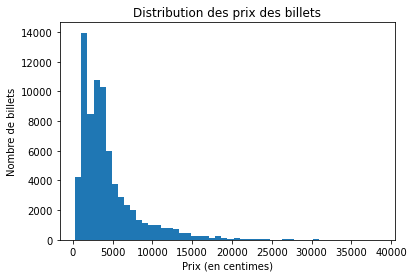

In [34]:

plt.hist(ticket_data['price_in_cents'], bins=50)
plt.xlabel('Prix (en centimes)')
plt.ylabel('Nombre de billets')
plt.title('Distribution des prix des billets')
plt.show()

Pour étudier les relations entre les différentes variables et le prix, on peut utiliser une matrice de corrélation 

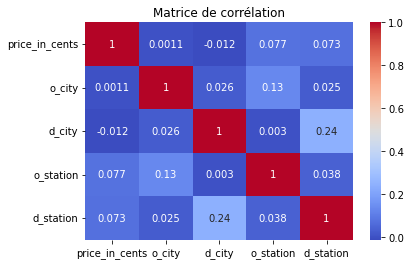

In [35]:
import seaborn as sns

# Sélection des variables numériques
num_vars = ['price_in_cents', 'o_city', 'd_city', 'o_station', 'd_station']

# Création de la matrice de corrélation
corr = ticket_data[num_vars].corr()

# Affichage de la matrice de corrélation
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Matrice de corrélation')
plt.show()

### Histogramme des départs en fonction de l'heure de la journée

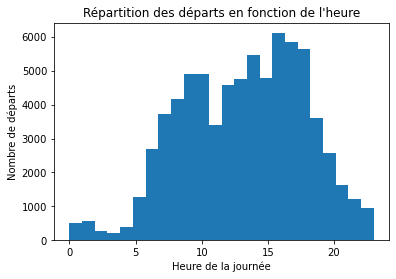

In [36]:

ticket_data['departure_hour'] = pd.to_datetime(ticket_data['departure_ts']).dt.hour
plt.hist(ticket_data['departure_hour'], bins=24)
plt.xlabel('Heure de la journée')
plt.ylabel('Nombre de départs')
plt.title('Répartition des départs en fonction de l\'heure')
plt.show()



### Le temps de trajey moyen par ville de départ 

In [38]:
ticket_data.groupby(['local_name_d_city'])['duration'].mean()

local_name_d_city
Aachen, Nordrhein-Westfalen, Deutschland                8.864706
Abbeville, Hauts-de-France, France                      5.047561
Agde, Occitanie, France                                 7.225000
Agen, Nouvelle-Aquitaine, France                        9.422549
Aix-en-provence, Provence-Alpes-Côte d'Azur, France     6.863027
                                                         ...    
Vitré, Bretagne, France                                 3.467241
Voiron, Auvergne-Rhône-Alpes, France                    6.438485
Warsaw, Mazowieckie, Polska                            27.083333
Zürich, Zürich, Schweiz                                 8.500000
Сердика, Столична, България                            78.937500
Name: duration, Length: 332, dtype: float64

### Le transport le plus populaire par ville 

In [40]:
ticket_data.groupby(['local_name_d_city','transport_type'])['id'].count().unstack()

transport_type,bus,carpooling,train
local_name_d_city,,,
"Aachen, Nordrhein-Westfalen, Deutschland",3.0,2.0,12.0
"Abbeville, Hauts-de-France, France",NaN,3.0,38.0
"Agde, Occitanie, France",NaN,2.0,2.0
"Agen, Nouvelle-Aquitaine, France",10.0,1.0,6.0
"Aix-en-provence, Provence-Alpes-Côte d'Azur, France",59.0,192.0,152.0
...,...,...,...
"Vitré, Bretagne, France",NaN,34.0,24.0
"Voiron, Auvergne-Rhône-Alpes, France",9.0,30.0,16.0
"Warsaw, Mazowieckie, Polska",4.0,1.0,NaN


Pour analyser la répartition des départs et des arrivées en fonction du temps et des villes, on peut utiliser des graphiques de type histogramme ou nuage de points: 

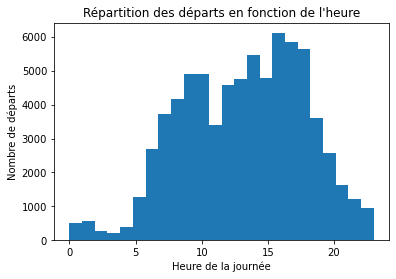

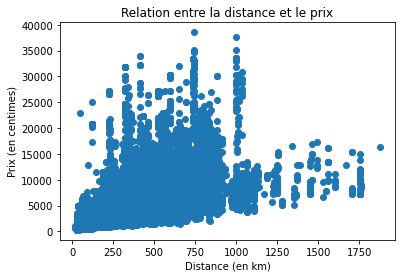

In [42]:
# Histogramme des départs en fonction de l'heure de la journée
ticket_data['departure_h'] = pd.to_datetime(ticket_data['departure_ts']).dt.hour
plt.hist(ticket_data['departure_h'], bins=24)
plt.xlabel('Heure de la journée')
plt.ylabel('Nombre de départs')
plt.title('Répartition des départs en fonction de l\'heure')
plt.show()

# Nuage de points des prix en fonction de la distance entre les villes
plt.scatter(ticket_data['distance'], ticket_data['price_in_cents'])
plt.xlabel('Distance (en km)')
plt.ylabel('Prix (en centimes)')
plt.title('Relation entre la distance et le prix')
plt.show()

### Nuage de points pour étudier la relation entre le prix et la distance 

<AxesSubplot:xlabel='distance', ylabel='price_in_cents'>

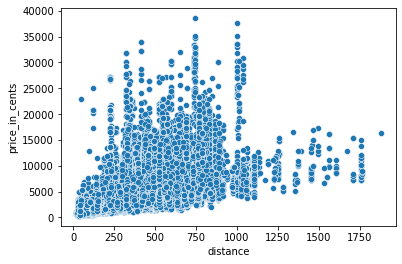

In [44]:
sns.scatterplot(x='distance',y='price_in_cents',data=ticket_data)

### Graphe de densité pour visualiser la distrubtion des prix pour chaque compagnie 

C:\Users\Wiem\anaconda3\lib\site-packages\seaborn\distributions.py:316: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.



<AxesSubplot:xlabel='price_in_cents', ylabel='Density'>

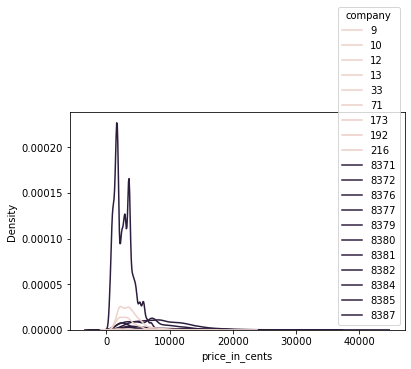

In [45]:
sns.kdeplot(x='price_in_cents',hue='company',data=ticket_data)

### Diagramme en boîte pour visualiser la distribtion des prix par type de transport

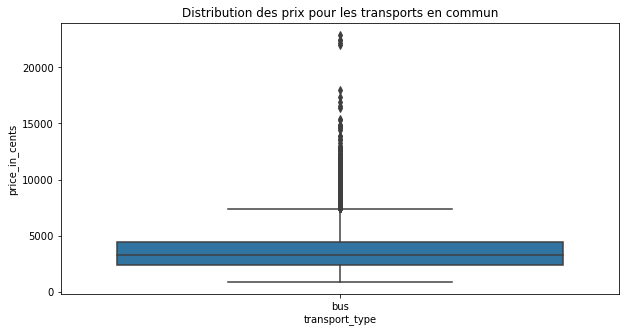

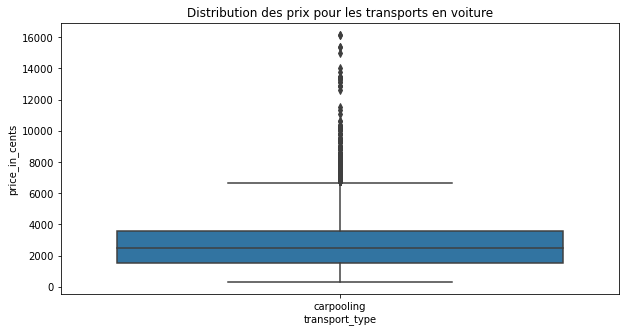

In [66]:
# crée un sous-ensemble des données pour les transports en commun
public_transp = ticket_data[ticket_data['transport_type'] == 'bus']

# crée un sous-ensemble des données pour les transports en commun
car_transp = ticket_data[ticket_data['transport_type'] == 'carpooling']

# Créer un diagramme en boîte pour les prix des transports en commun
fig, ax = plt.subplots(figsize=(10, 5))
sns.boxplot(x='transport_type',y='price_in_cents' , data = public_transp)
ax.set_title('Distribution des prix pour les transports en commun')
plt.show()

# Créer un diagramme en boîte pour les prix des transports en voiture
fig, ax = plt.subplots(figsize=(10, 5))
sns.boxplot(x='transport_type',y='price_in_cents' , data = car_transp)
ax.set_title('Distribution des prix pour les transports en voiture')
plt.show()




### Api Externes

Ce code envoie une requette HTTP Get ) l'API openWeatherMap pour récuperer les données météorologiques de la ville spécifiée.
La reponse est ensuite affichée en format JSON.

In [51]:
import requests

In [57]:
#clé API openWeatherMap
api_key = '8f5e03976e99f5ee7b281e9a079fe74d'
#ville pour laquelle nous voulons les données météorologiques
ville = "Paris"
# URL de l'API OpenWeatherMap pour récupérer les données météorologiques
url = f"http://api.openweathermap.org/data/2.5/weather?q={ville}&appid={api_key}"

# envoyer une requête HTTP GET pour récupérer les données
response = requests.get(url)

# afficher les données récupérées
print(response.json())

{'cod': 401, 'message': 'Invalid API key. Please see https://openweathermap.org/faq#error401 for more info.'}
